# Summary

We'll be using the [2020 Stack Overflow Developer Survey](https://insights.stackoverflow.com/survey/2020) to create a predictive model for developer compensations in the United States. The model will assume that there is no relationship between developer compensations and Stack Overflow usage, and will also assume that everyone told the truth. 

We will...
- Read and clean the data
- Encode and impute the observations
- Make a baseline
- Select the most highly correlated measurements to developer salary 
- Build a ridge regression model around the data
- Tune the hyperparameters for the imputer/ridge regression
- Build a random forest model to predict the residuals of our ridge model

I've carefully commented to code to make it hyper-noob-friendly.

# Read/Clean

In [1]:
import pandas as pd
import pandas_profiling
from numpy import NaN

### Functions

Here, we'll define some functions for cleaning and preparing the dataset for the package we'll use to build our model. 

Generally speaking, it all cleans raw text and gets rid of the strange columns.

In [2]:
# Cleans the mixed values
# Only called within the clean function
def clean_mixed(inp):
    if inp == 'Younger than 5 years' or inp == 'Older than 85' or inp =='Less than 1 year':
        return 0
    elif inp == 'More than 50 years':
        return 50
    
    # Numpy NaN values are actually floats... and we want to keep them NaNs so later we can change them to something meaningful
    elif isinstance(inp, float):
        return NaN
    else:
        return(int(inp))
    

# A list of columns that I merely perceived as relevant
cols_to_use = ['MainBranch', 'Hobbyist', 'Age', 'Age1stCode',
               'DatabaseWorkedWith', 'DevType', 'EdLevel', 'Employment', 
               'Ethnicity', 'Gender', 'LanguageWorkedWith', 'MiscTechWorkedWith', 
               'NEWCollabToolsWorkedWith', 'NEWOvertime', 'OrgSize', 'OpSys', 
               'PlatformWorkedWith', 'Sexuality',  'Trans', 'UndergradMajor', 
               'YearsCode', 'YearsCodePro', 'JobFactors', 
                'WebframeWorkedWith', 'ConvertedComp', 'WorkWeekHrs']


# Cleans the dataframe of wonky things non-productive to our model
def clean(dataframe):
    dataframe = dataframe[dataframe['Country'] == 'United States']
    dataframe = dataframe[(dataframe['ConvertedComp'] > 20_000) &      #10000
                          (dataframe['ConvertedComp'] < 500_000)]      #400_000
    dataframe = dataframe[cols_to_use]
    
    # Clean the mixed values and make year-based columns actually int
    # They're currently objects (str) because values like 'less than 1 yr' 
    dataframe['YearsCode'] = dataframe['YearsCode'].apply(clean_mixed)
    dataframe['YearsCodePro'] = dataframe['YearsCodePro'].apply(clean_mixed)
    dataframe['Age1stCode'] = dataframe['Age1stCode'].apply(clean_mixed)
    
    # Loops through columns with this 'object1;object2;object3' format and onehot encodes each individual dummy variable
    
    #       Col         val1    val2   val3
    # val1;val2   >>>      1       1      0
    # val2;val3            0       1      1
    #      val1            1       0      0
    semicolon_separated = ['MiscTechWorkedWith', 'DatabaseWorkedWith', 'LanguageWorkedWith', 
                           'PlatformWorkedWith', 'NEWCollabToolsWorkedWith', 'DevType', 
                           'Ethnicity', 'Sexuality', 'Gender', 'JobFactors', 'WebframeWorkedWith']
    for col in semicolon_separated:
        to_concat = dataframe[col].str.get_dummies(sep=';')
        dataframe.drop(columns=col, inplace=True)
        dataframe = pd.concat([dataframe, to_concat], axis=1)
    
    # The above encoding just created a few duplicate columns which everything hates so we have to rename with this... 
    # col col col > col 1 col 2 col 3 
    # ... scheme
    
    # Counts the columns and gets columns listed more than once
    non_unique_cols = []
    counts = dataframe.columns.value_counts()
    for i, col in enumerate(counts):
        if col > 1:
            non_unique_cols.append(counts.index[i])

    # Loop through columns and renames duplicates with a number appended
    counts = {}
    to_replace = []
    for col in dataframe.columns:
        # Checks if col is in dictionary above
        if col in non_unique_cols:
            # ...if it is, add one to the dictionary and append the new column name to the replacement name list
            if col in counts:
                counts[col] += 1
                to_replace.append(f'{col} {counts[col]}')
            # ...if it's not, set the dictionary value to one and append altered column name.
            else:
                counts[col] = 1
                to_replace.append(f'{col} {counts[col]}')
        # 
        else:
            to_replace.append(col)

    dataframe.columns = to_replace

    dataframe['ConvertedComp'].dropna(inplace=True)
    return dataframe

### Read/Clean the data

In [4]:
data = pd.read_csv('../assets/developer_survey_2020/survey_results_public.csv', index_col='Respondent')
base_data = pd.read_csv('../assets/developer_survey_2020/survey_results_public.csv', index_col='Respondent')
# I'll read it twice just incase I need to compare the cleaned to a reference later on

data = clean(data)

Let's take a look at the output of a package whose usage is to help us get our data right

In [42]:
pandas_profiling.ProfileReport(data)

# **Model**

Here we'll build our model. 

We will...
- Split our data into a predictors and our predicted (X, y)
- Further split our model into **two sets**
    - **Train set** We'll build the model around this set.
    - **Validation set** We'll use this set in tune our model to get better predictions on unseen data
- Fit a ridge regression model around the **train set**
- Fine tune the settings (hyperparameters) by creating a ton of models with different settings and using the one that scores the best on the **validation set**

In [5]:
from sklearn.inspection import permutation_importance
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.feature_selection import SelectKBest
from sklearn.linear_model import Ridge
from sklearn.impute import SimpleImputer
from category_encoders import OneHotEncoder # Category encoders instead of sklearn because it likes pandas more
from sklearn.pipeline import make_pipeline
from sklearn.metrics import r2_score, mean_absolute_error
from xgboost import XGBRegressor

### Data Splits

In [195]:
# Predictor/predicted split respectively...
X = data.drop(columns='ConvertedComp')
y = data['ConvertedComp']
# ... and our train/validation split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2)

### Baseline

Now, before we can do anything, we must build a hyper-simple model to compare our real model to. In this case, for every single observation we will merely predict the compensation is the mean compensation. Terrible, right? 

In [196]:
baseline = y_train.mean()
training_mae = mean_absolute_error(y_true=y_train, y_pred=[baseline] * len(y_train))
validation_mae = mean_absolute_error(y_true=y_val, y_pred=[baseline] * len(y_val))

print(f'The BASELINE mean error of TRAIN SET:            {round(validation_mae, 2)}')
print(f'The BASELINE mean error of VALIDATION SET:       {round(training_mae, 2)}')


# Creating some dataframes and storing our results
model_stats_mae, model_stats_r2 = pd.DataFrame(), pd.DataFrame()
model_stats_mae['SET'] = ['Train', 'Validation']
model_stats_r2['SET'] = ['Train', 'Validation']
model_stats_mae['BASELINE'] = [training_mae, validation_mae]
model_stats_r2['BASELINE'] = [0, '0~']

The BASELINE mean error of TRAIN SET:            44241.05
The BASELINE mean error of VALIDATION SET:       44325.5


The output above gives you a small glimpse into the deeper purpose of train/validation sets.

### Model Pipeline

In [197]:
# A pipeline is a SKLearn object that chains functions and their output together
model = make_pipeline(OneHotEncoder(),     # Turns categorical columns into binary columns for each individual category
                     SimpleImputer(),      # Replaces NaN values with the average of that value
                     SelectKBest(k=188),   # Selects the k amount of columns most correlated to what we're predicting
                     Ridge(solver='saga',  # Fits a least squared line with a limp wrist that slightly underfits ...
                           alpha=50.87))   # ...the training data
# And then we 'fit' the model to our training data.
model.fit(X_train, y_train);

c:\users\custom\.virtualenvs\ds-unit-2-applied-modeling-l_nxdzr6\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):
c:\users\custom\.virtualenvs\ds-unit-2-applied-modeling-l_nxdzr6\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: divide by zero encountered in true_divide
  f = msb / msw


In [198]:
# And then we'll use data our model has never seen before (validation set) to see how our model performs on new data...
# by making predictions...
train_prediction = model.predict(X_train)
val_prediction = model.predict(X_val)

# ... and getting some scores from them.
train_mae = mean_absolute_error(y_true=y_train, y_pred=train_prediction)
val_mae = mean_absolute_error(y_true=y_val, y_pred=val_prediction)

train_r2 = r2_score(y_true=y_train, y_pred=train_prediction)
val_r2 = r2_score(y_true=y_val, y_pred=val_prediction)

print(f'The mean error of TRAIN SET:             {round(train_mae, 2)}')
print(f'The mean error of VALIDATION SET:        {round(val_mae, 2)}')

model_stats_mae['MODEL'] = [train_mae, val_mae]
model_stats_r2['MODEL'] = [train_r2, val_r2]

The mean error of TRAIN SET:                    33121.78
The mean error of VALIDATION SET:               34491.65


### Feature Importances

Now it is time to calculate the most important columns just out of curiosity. Typically, we would standardize each column by making their means and value ranges the same and get the coefficient because it's a linear model, but instead, I'll use permutation importance for demostration purposes.

Permutation importance takes each individual column and randomly shuffles it to see the impact it has on the model. The worsening of the model compared to a baseline (all columns unshuffled) tells us how important the shuffled column is. If a model does just as well with one column shuffled, the shuffled column isn't very important. On the contrary, a model doing significantly worse with one of the columns shuffled relies on that shuffled column more

In [145]:
# This is the function that does what's described above. n_jobs=-1 runs it on all our cores.
permutation_output = permutation_importance(model, X_val, y_val, n_jobs=-1)

In [173]:
# The function we used generates 5 values for each column so we cast the means of each column to a new list
importances = []
for imp in permutation_output.importances:
    importances.append(sum(imp) / len(imp))

# And now we'll cast the column names/importances to a dataframe so it's easier to sort/filter
features = pd.DataFrame()
features['label'] = X_val.columns
features['importance'] = importances

# ...and then we'll sort/filter it
features.sort_values(by='importance', ascending=False, inplace=True)
features.reset_index(inplace=True, drop=True)
features = features[features['importance'] > 0.000001]

In [196]:
pd.options.display.max_rows = 99
features.head(99)

,label,importance
0,YearsCodePro,0.228098
1,OrgSize,0.067394
2,OpSys,0.025339
3,WorkWeekHrs,0.018626
4,EdLevel,0.015279
5,Engineering manager,0.010711
6,Academic researcher,0.010590
7,Age1stCode,0.007318
8,Senior executive/VP,0.006921
9,"Google Suite (Docs, Meet, etc)",0.006774


### Plot Feature Importances

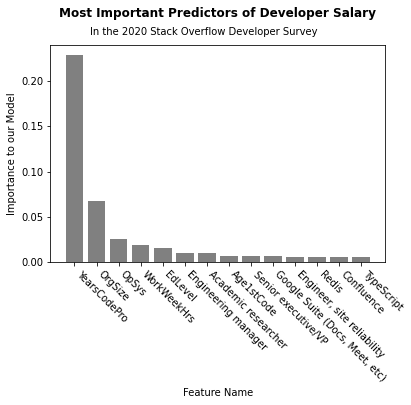

In [169]:
import matplotlib.pyplot as plt
plt.bar(x=features['label'], height=features['importance'], color='Grey')
plt.xticks(rotation=-45, ha='left')
plt.title('Most Important Predictors of Developer Salary', fontweight='bold', y=1.1)
plt.text(s='In the 2020 Stack Overflow Developer Survey', y=0.25, x=0.7)
plt.xlabel('Feature Name')
plt.ylabel('Importance to our Model')
plt.show()

# Squeezing More

We REALLY want more predictive power from this model... and so, we'll implement a...
- **Grid Search** -      We train a ton of models on different settings to see which does best
- **Boosting Model** -   We train a model to predict the RESIDUALS (basically, our predictions distance from their actual values) of our model above. 

### Grid Search

In [215]:
# These 3 lines take longer to run than anything we've seen thus far...

# Since the things we want to change the settings for are within a pipeline we must access that pipeline object with this syntax 
# (pipeline_object__setting_to_change:[list of different settings to try])
# We can get pipeline object names with 'pipeline.named_steps'

params = {'selectkbest__k':[185 + x for x in range(5)], 
          'ridge__alpha':[50.8 + x * 0.01 for x in range(30)]}

out = GridSearchCV(estimator=model, param_grid=params, 
                   verbose=True, n_jobs=-1)

out.fit(X_train, y_train);

# NOTE:
# A good practice with grid search is to find individual settings at a time at a wide range, and once you lock a setting in...
# ...stone, instead of throwing it into the model and expecting all individually found settings to work well together, keep...
# ...the setting in the search except at a lower range so you don't waste time but can still adjust to setting interactions.

Fitting 5 folds for each of 150 candidates, totalling 750 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


KeyboardInterrupt: 

In [81]:
dictionary = out.best_params_
for key in dictionary.keys():
    name, setting = key.split('__')
    best_score = dictionary[key]
    print(f'The best setting we found for the "{setting}" setting in our {name} was {best_score}')

The best setting we found for the "alpha" setting in our ridge was 50.87
The best setting we found for the "k" setting in our selectkbest was 188


## Boosting

In [9]:
import numpy as np

# The first step to boosting is generating predictions and getting residuals, so first we get our model predictions.
y_pred_train = model.predict(X_train)
y_pred_val = model.predict(X_val)

# Now we will run a copy of the data through some manual cleaning, so midway through we can append the residuals.
cleaner = make_pipeline(OneHotEncoder(),
                        SimpleImputer(),
                        SelectKBest(k=188))
X_train_clean = cleaner.fit_transform(X_train, y_train)
X_val_clean = cleaner.transform(X_val)

# And since we will use the generated prediction to attempt to guess the residual, we will also add the predictions to the data.
X_train_clean = np.concatenate([X_train_clean, np.expand_dims(y_pred_train, 1)], axis=1)
X_val_clean = np.concatenate([X_val_clean, np.expand_dims(y_pred_val, 1)], axis=1)

# And now we finally calculate the residuals, which is just basic math made basic with numpy™
res_train = y_train - y_pred_train
res_val = y_val - y_pred_val

c:\users\custom\.virtualenvs\ds-unit-2-applied-modeling-l_nxdzr6\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


### Booster

In [10]:
from xgboost import XGBRFRegressor, XGBRegressor
# Now let's finally make that model to predict our residuals
booster = XGBRFRegressor(n_estimators=72,
                         min_child_weight=1.01)

booster.fit(X_train_clean, res_train)
booster.score(X_val_clean, res_val)

0.10904744417428935

In [191]:
# Another implementation of a cross-validated grid search
params = {'n_estimators':[x + 70 for x in range(2, 10)], 'min_child_weight':[x * 0.01 for x in range(100, 120)]}
search_output = GridSearchCV(estimator=booster, param_grid=params, verbose=True, n_jobs=-1)
search_output.fit(X_train_clean, res_train)

Fitting 5 folds for each of 160 candidates, totalling 800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


KeyboardInterrupt: 

In [155]:
search_output.best_params_

{'min_child_weight': 1.01, 'n_estimators': 72}

In [12]:
# Get residual predictions from our booster...
train_res_pred = booster.predict(X_train_clean)
val_res_pred = booster.predict(X_val_clean)

# Get predictions from our model...
train_model_pred = model.predict(X_train)
val_model_pred = model.predict(X_val)

# Combine them...
train_comb = train_res_pred + train_model_pred
val_comb = val_res_pred + val_model_pred

# And calculate their MAE
booster_train_mae = mean_absolute_error(y_true=y_train, y_pred=train_comb)
booster_val_mae = mean_absolute_error(y_true=y_val, y_pred=val_comb)
# And their r2
booster_train_r2 = r2_score(y_true=y_train, y_pred=train_comb)
booster_val_r2 = r2_score(y_true=y_val, y_pred=val_comb)

print(f'The mean error of TRAIN SET:                    {round(booster_train_mae, 2)}')
print(f'The mean error of VAL SET:                      {round(booster_val_mae, 2)}')

model_stats_mae['BOOSTED'] = [booster_train_mae, booster_val_mae]
model_stats_r2['BOOSTED'] = [booster_train_r2, booster_val_r2]

The mean error of TRAIN SET:                    30033.53
The mean error of VAL SET:                      31907.21


# Final Results

In [13]:
model_stats_mae

,SET,BASELINE,MODEL,BOOSTED
0,Train,44379.774900,33330.767831,30033.534302
1,Validation,44081.993263,33937.861726,31907.207143


Mean absolute error means on average, our guess for developer salary will be +=$25,000! Not great, not terrible...

In [14]:
model_stats_r2

,SET,BASELINE,MODEL,BOOSTED
0,Train,0,0.391236,0.520359
1,Validation,0~,0.372282,0.441216


R2 is the variation in the data described by the model. 44% of developer income is linearly related to the input data, and the rest is still an enigma!

All and all, our model performs aprox. 30% better than our baseline and describes 40% of the variation in our data. 

It's likely possible to squeeze a lot more performance out of it with more hyperparameter tuning and more careful cleaning of the data. 

In [272]:
final = pd.DataFrame()
final['True'] = y_val
final['Prediction'] = val_comb
final['Residual'] = np.array(y_val - val_comb)
final.sort_values('True', inplace=True)
final['MA50'] = final['Residual'].rolling(50).mean()

final.dropna(inplace=True)

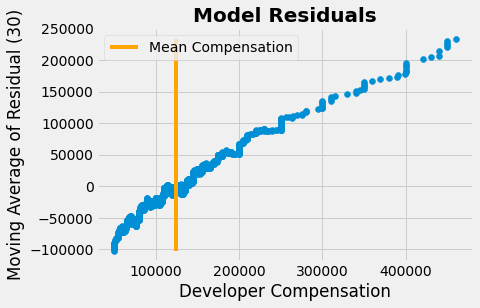

In [273]:
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
plt.scatter(y=final['MA50'], x=final['True'])
plt.title('Model Residuals', fontweight='bold', fontsize=20)
plt.ylabel('Moving Average of Residual (30)')
plt.xlabel('Developer Compensation')
plt.vlines(data['ConvertedComp'].mean(), ymin=final['MA50'].min(), ymax=final['MA50'].max(), color='orange', label='Mean Compensation')
plt.legend()

### Not very good!

# Web App Pipeline

Final note on something pretty cool- XGBoost actually supports sklearn pipelines, making it pretty easy to slap together, pickle, and implement into a web applet or something like that... So we're going to do exactly that!

In [274]:
# We will use a simple regressor that's boosted with a shallow random forest and drop the selectkbest for the web app model.
web_pipeline = make_pipeline(OneHotEncoder(),     
                     SimpleImputer(),      
                     XGBRegressor(learning_rate=0.08, reg_alpha=0.3, booster='dart'))

web_pipeline.fit(X_train, y_train);

c:\users\custom\.virtualenvs\ds-unit-2-applied-modeling-l_nxdzr6\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


In [275]:
mean_absolute_error(y_true=y_val, y_pred=web_pipeline.predict(X_val))

33231.1713873672

In [205]:
# Final grid search...
params = {'xgbregressor__learning_rate':[0.07 + x * 0.005 for x in range(10)], 'xgbregressor__reg_alpha':[x * 0.3 for x in range(3)], 'xgbregressor__booster':['gbtree', 'gblinear', 'dart']}
search_out_temp = GridSearchCV(estimator=temp_model, param_grid=params, verbose=True, n_jobs=-1)
search_out_temp.fit(X_train, y_train)

Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


KeyboardInterrupt: 

In [42]:
search_out_temp.best_params_

{'xgbregressor__booster': 'dart',
 'xgbregressor__learning_rate': 0.08,
 'xgbregressor__reg_alpha': 0.3}

## Picking the Pipeline

Now we will turn dump our compacted model so we can load it back into the memory later in the webapp without re-training everything locally. 

We will also pickle an empty dataframe that contains the columns we will need later on and in the exact order.

In [230]:
empty = data[0:0].drop()
for col in empty.columns:
    empty.loc[0, col] = 0

<ipython-input-230-682a30bf05f7>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  empty.loc[0, col] = 0


In [231]:
empty

,MainBranch,Hobbyist,Age,Age1stCode,EdLevel,Employment,NEWOvertime,OrgSize,OpSys,Trans,...,Express,Flask,Gatsby,Laravel,React.js,Ruby on Rails,Spring,Symfony,Vue.js,jQuery
Respondent,,,,,,,,,,,,,,,,,,,,,
0,0,0,0.0,0.0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [234]:
web_pipeline.predict(empty.drop('ConvertedComp', axis=1))

array([58593.223], dtype=float32)

In [255]:
import joblib
import sklearn
import category_encoders

joblib.dump(web_pipeline, 'dump.joblib', compress=True)
# I'll also dump an empty row of the dataframe so I don't have to deal with all individual columns later on. 
joblib.dump(empty.drop('ConvertedComp', axis=1), 'df.joblib', compress=True)


print(f'joblib=={joblib.__version__}')
print(f'scikit-learn=={sklearn.__version__}')
print(f'category_encoders=={category_encoders.__version__}')

joblib==0.17.0
scikit-learn==0.23.2
category_encoders==2.2.2
